# MegaDetector tests

In [1]:
import json
import pandas as pd
from PIL import Image
import matplotlib.pyplot as plt
import matplotlib.patches as patches

Output file for a batch of images: `.json`  
Command example: `python detection/run_detector_batch.py $LYNX_PROJECT/data_pipeline/megadetector/md_v5a.0.0.pt $ALL_CCFRSCRATCH/datasets/extracted/Deep learning lynx - data/0_dataset_raw/0_dataset_Marie_OCS/OCS_Arcos $LYNX_PROJECT/data_pipeline/megadetector/res.json --output_relative_filenames --recursive --checkpoint_frequency 10000 --quiet`

In [2]:
with open("./megadetector/res_test.json", "r") as json_file:
    data = json.load(json_file)

Construction of a dataframe from the json to obtain the bounding boxes for the images

In [3]:
flat_data = [{'file': img['file'],
              'category': det['category'],
              'conf': det['conf'],
              'x': det['bbox'][0],
              'y': det['bbox'][1],
              'width': det['bbox'][2],
              'height': det['bbox'][3]}
             for img in data['images']
             for det in img['detections']]

df = pd.DataFrame(flat_data)
df

,file,category,conf,x,y,width,height
0,Arcos_OCS_NA_2019-09-24_NA_1.jpg,1,0.904,0.2576,0.08421,0.48600,0.6726
1,Arcos_OCS_NA_2021-04-03_NA_6.JPG,1,0.958,0.4641,0.41200,0.09092,0.1022
2,Arcos_OCS_NA_2021-05-13_NA_7.JPG,1,0.937,0.2078,0.46060,0.08138,0.1030
3,Arcos_OCS_NA_2021-12-14_NA_5.jpg,1,0.925,0.1679,0.30830,0.37180,0.2865
4,Arcos_OCS_NA_2022-01-25_NA_4.jpg,1,0.960,0.0464,0.09513,0.53590,0.5096
5,Arcos_OCS_NA_2022-08-06_NA_2.JPG,1,0.970,0.1043,0.37170,0.24890,0.2735
6,Arcos_OCS_NA_NA_NA_3.jpg,1,0.887,0.3751,0.47230,0.19330,0.2320


**Note:** the bounding box dimensions are relative to the image

## Example with an image

In [4]:
selected_image_index = 5
image_path = "/gpfsscratch/rech/ads/commun/datasets/extracted/Deep learning lynx - data/0_dataset_raw/0_dataset_Marie_OCS/OCS_Arcos/" + df.iloc[selected_image_index]['file']
x, y, width, height = df.iloc[selected_image_index][['x', 'y', 'width', 'height']]

print(image_path)
print(x, y, width, height)

/gpfsscratch/rech/ads/commun/datasets/extracted/Deep learning lynx - data/0_dataset_raw/0_dataset_Marie_OCS/OCS_Arcos/Arcos_OCS_NA_2022-08-06_NA_2.JPG
0.1043 0.3717 0.2489 0.2735


Display of the bounding box in the initial image after scaling the dimensions of the bounding box

720.9216 1926.8927999999999 1720.3968 1417.824


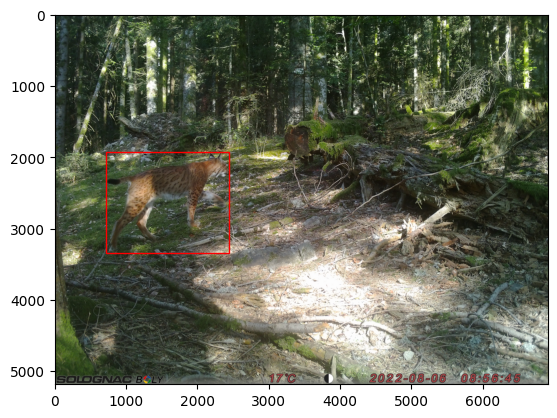

In [5]:
image = Image.open(image_path)
im_width, im_height = image.size


x_norm = x*im_width
y_norm = y*im_height
w_norm = width*im_width
h_norm = height*im_height
print(x_norm, y_norm, w_norm, h_norm)

fig, ax = plt.subplots(1)
ax.imshow(image)
rect = patches.Rectangle((x_norm, y_norm), w_norm, h_norm, linewidth=1, edgecolor='r', facecolor="none")
ax.add_patch(rect)
plt.show()

A simple crop

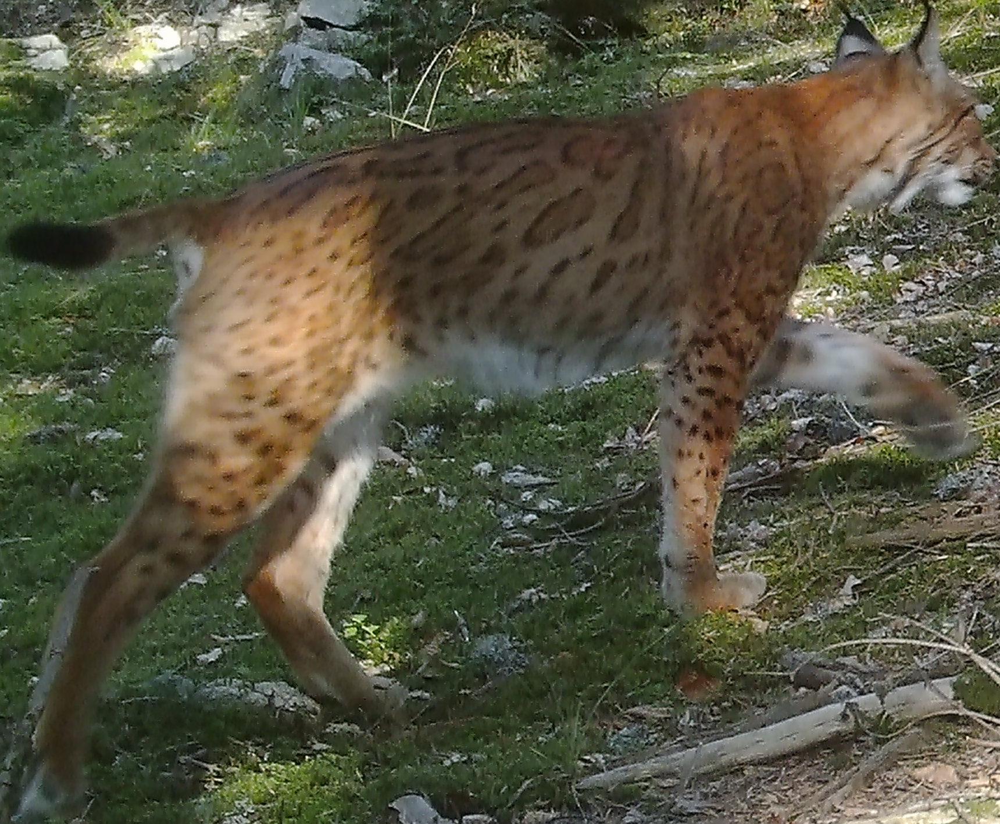

In [6]:
left = x_norm
top = y_norm
right = x_norm + w_norm
bottom = y_norm + h_norm

image.crop((left, top, right, bottom))

A crop with zoom-out

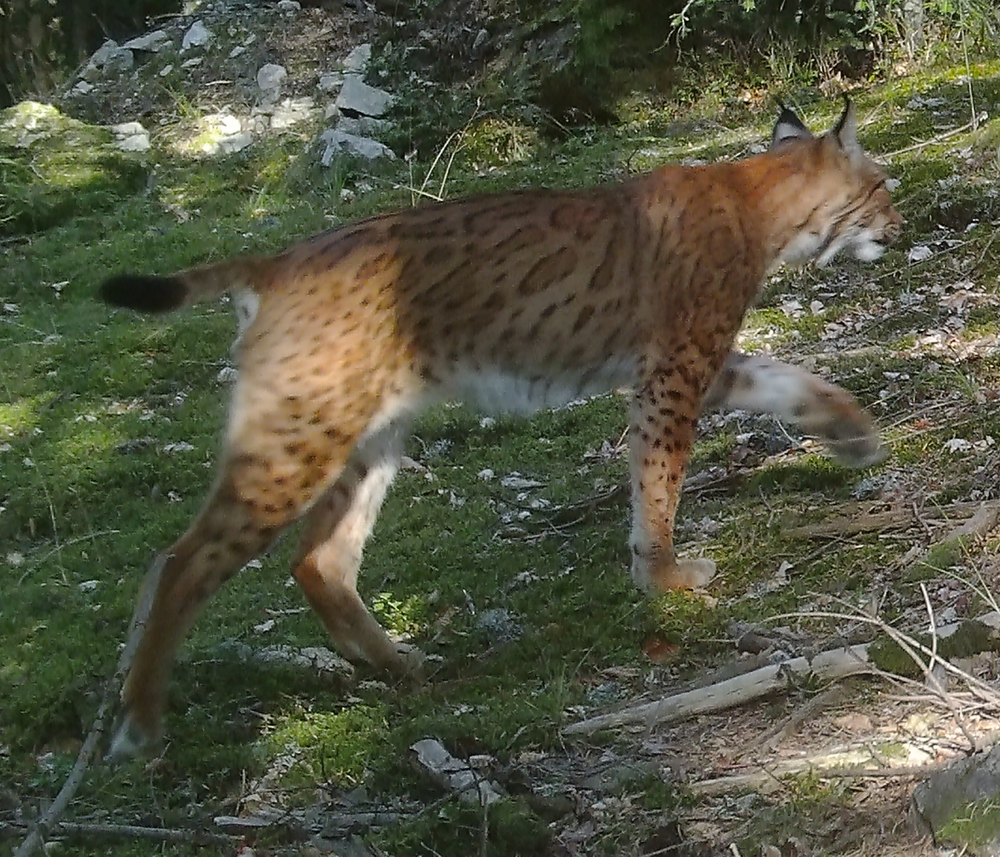

In [7]:
left_unzoom = left - 200
top_unzoom = top - 200
right_unzoom = right + 200
bottom_unzoom = bottom + 200

image.crop((left_unzoom, top_unzoom, right_unzoom, bottom_unzoom))

A crop with zoom

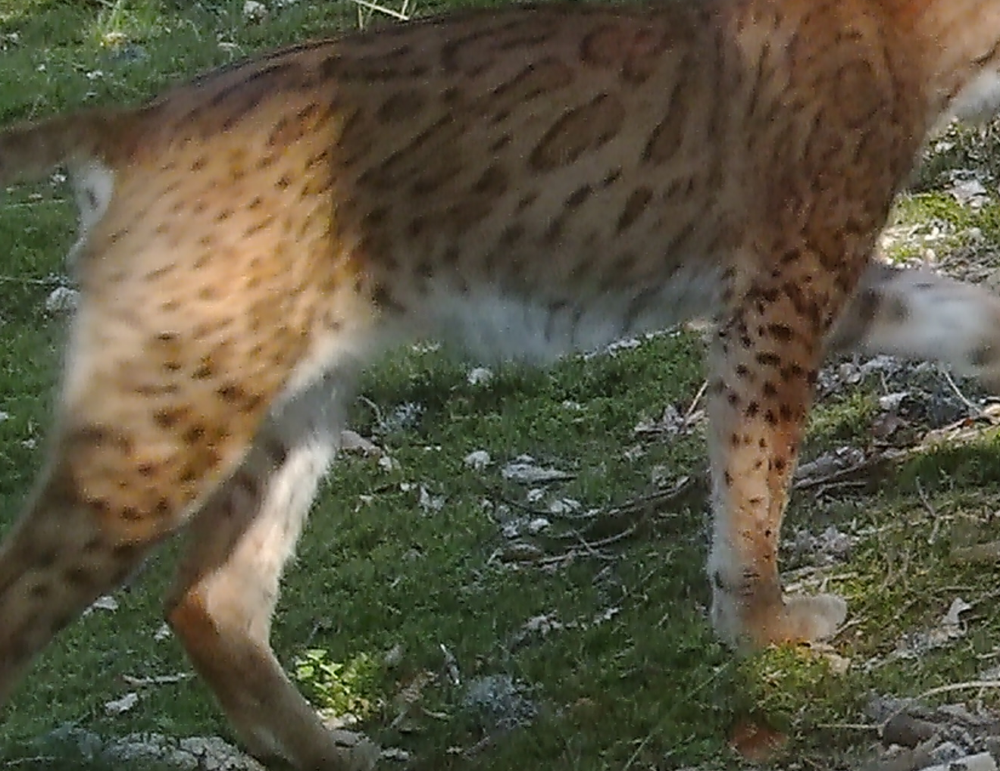

In [8]:
left_zoom = left + 200
top_zoom = top + 200
right_zoom = right - 200
bottom_zoom = bottom - 200

image.crop((left_zoom, top_zoom, right_zoom, bottom_zoom))